In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from scipy.optimize import minimize
from matplotlib.animation import FuncAnimation


# The below commands make the font and image size bigger
plt.rcParams.update({'font.size': 12})
plt.rcParams["figure.figsize"] = (6,4)

# 1:
## We have tried to numerically solve the below ODE using a basic shooting method.
## First we tackle Drought Period
## The ODE we tried to solve was 
## $x'^{2}+xx''+x=0$   from eqn 4.78 in the notes
## With the boundary conditions 
### $X(0)=0$
### $X'(1)=0$
## Re-arranged to get 
## $x'' = \frac{-x-x'^2}{x}$

Text(0.5, 1.0, 'Shooting Method X(x)')

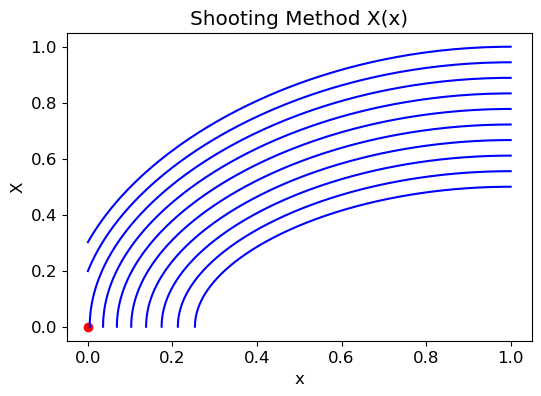

In [6]:
def X(t,y):
    return [y[1],(-y[0]-y[1]**2)/y[0]]


endvals = np.linspace(0.5,1,10)

for el in endvals:
    sol =solve_ivp(X,[1,0],[el,0],rtol=1e-12,atol = 1e-12)
    y = sol.y
    t = sol.t
    plt.plot(t,y[0],c='b')
   
plt.scatter(0,0,c='r')
plt.xlabel('x')
plt.ylabel('X')
plt.title('Shooting Method X(x)')

## We find the best X(x)

0.89


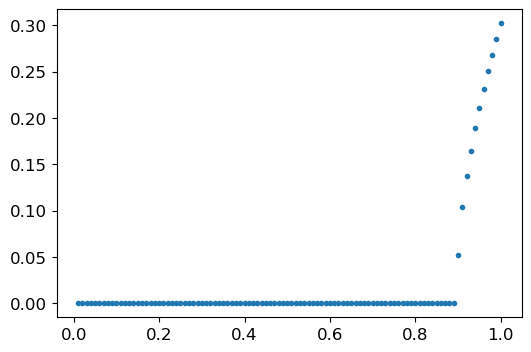

In [9]:
initderiv = np.linspace(0.01,1,100)
yx1 = np.array([])
for el in initderiv:
    sol =solve_ivp(X,[1,0],[el,0], rtol=1e-12,atol = 1e-12)
    t = sol.t
    yx1 = np.append(yx1,sol.y[0][-1])

plt.plot(initderiv,yx1,'.')

i= len(initderiv)-1
tol = 10e-6
while (i>0):
    if (yx1[i]<=tol):
        boundary = initderiv[i]
        break
    i+=-1
print(boundary)

## We pick the best boundary

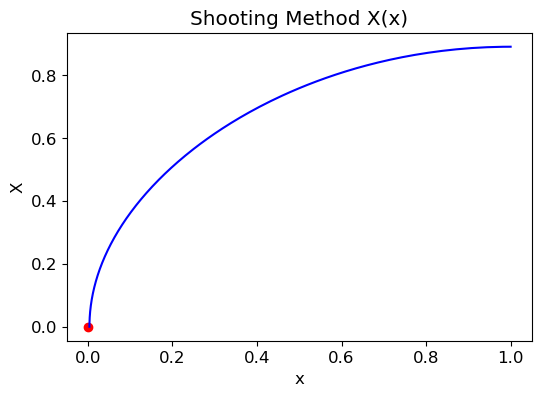

In [11]:
sol =solve_ivp(X,[1,0],[boundary,0],rtol=1e-12,atol = 1e-12)
y = sol.y
t = sol.t
plt.plot(t,y[0],c='b')
   
plt.scatter(0,0,c='r')
plt.xlabel('x')
plt.ylabel('X')
plt.title('Shooting Method X(x)')

X = y[0]
dX = y[1]
x = t

## We have that $ H(x) = \frac{X(x)}{\hat t + A} $
## We have that $ A = \frac{X(x)}{h_0(x)}$ set A = 1

## Height of Aquifer over Time 

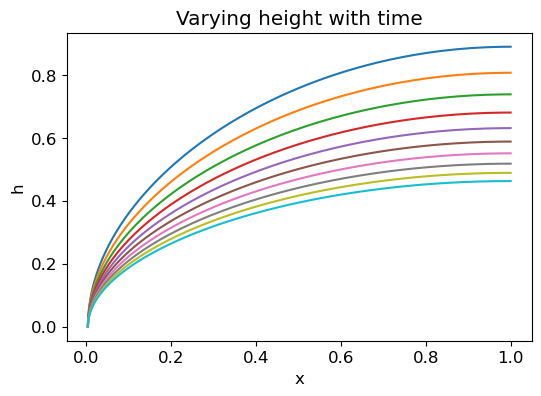

In [16]:
t = np.linspace(0,1,len(X))
h0 = 1
A = X/h0
h = np.zeros([len(x),len(t)])
i=0
while i < len(t):
    h[:,i] = X[:]/(1+t[i])
    i=i+1
plt.plot(x,h[:,::200])
plt.xlabel('x')
plt.ylabel('h')
plt.title('Varying height with time')
plt.show()

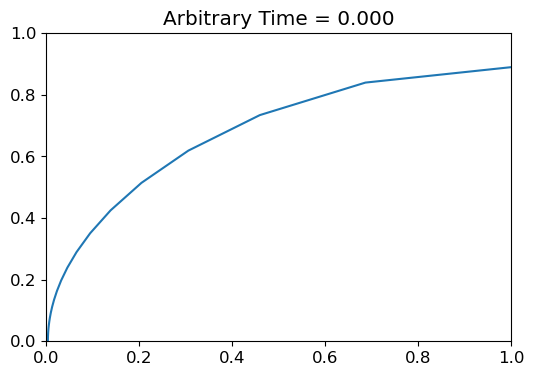

In [18]:
fig, ax = plt.subplots()
ax.axis([0,1,0,1])
x_1 = x[::20]
h_1 = h[::20,::20]

l, = ax.plot([],[])

def animate(i):
    l.set_data(x_1, h_1[:,i])
    ax.set_title('Arbitrary Time = %.3f'%(i/100))
    
ani = FuncAnimation(fig, animate, frames=len(h_1),interval=50)

from IPython.display import HTML
HTML(ani.to_jshtml())

# 2
## Rainfall
## $f-\eta f' = (ff')'+1$ eqn 4.55
## With Boundary Conditions
### $f(0) = 0 , f(\eta) = 1 $  as $ \eta \rightarrow \infty$

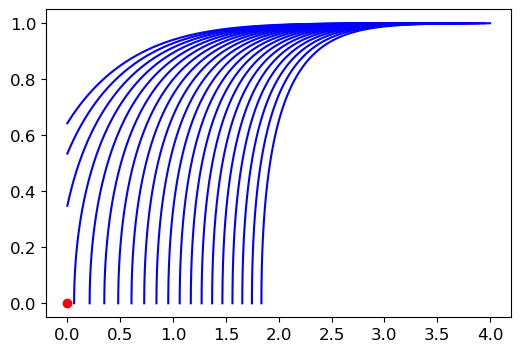

In [21]:
def f(t,y):
    return [y[1],(y[0]-t*y[1]-y[1]**2-1)/y[0]]


initderiv = np.linspace(3,4,20)

for el in initderiv:
    sol =solve_ivp(f,[el,0],[1,0.001],rtol=1e-12,atol = 1e-12)
    y = sol.y
    t = sol.t
    plt.plot(t,y[0],c='b')

plt.scatter(0,0,c='r')

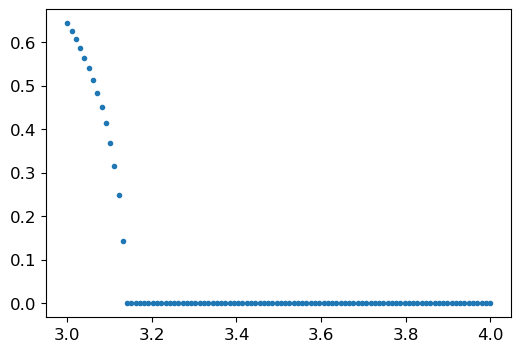

In [22]:
initderiv = np.linspace(3,4,100)
yx1 = np.array([])
for el in initderiv:
    sol =solve_ivp(f,[el,0],[1,0.001], rtol=1e-12,atol = 1e-12)
    t = sol.t
    yx1 = np.append(yx1,sol.y[0][-1])

plt.plot(initderiv,yx1,'.')

In [23]:
tol = 10e-6
i=0
while (i<len(initderiv)):
    if (yx1[i]<=tol):
        boundary = initderiv[i]
        break
    i+=1
boundary

3.1414141414141414

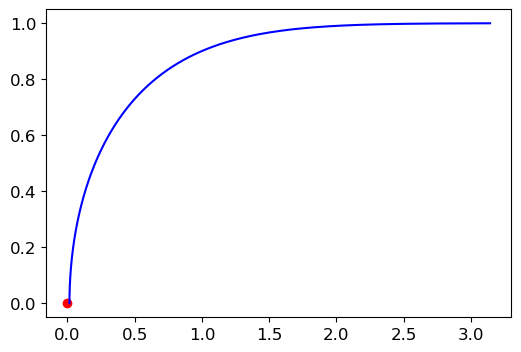

In [24]:
sol =solve_ivp(f,[boundary,0],[1,0.001],rtol=1e-12,atol = 1e-12)
y = sol.y
t = sol.t
## Extract values used for plotting height later
f_rain = y[0]
eta_rain = t

plt.plot(t,y[0],c='b')
plt.scatter(0,0,c='r')

## Now adding in variable Rainfall. Changing R

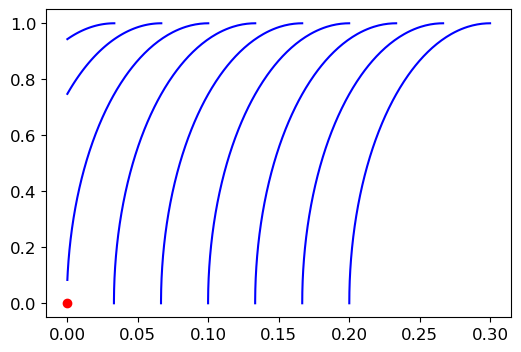

In [30]:
def frain(t,y,R):
    return [y[1],(y[0]-t*y[1]-y[1]**2-R)/y[0]]


initderiv = np.linspace(0,0.3,10)

R = 100

for el in initderiv:
    sol =solve_ivp(frain,[el,0],[1,0.001],args = (R,), rtol=1e-12,atol = 1e-12)
    y = sol.y
    t = sol.t
    plt.plot(t,y[0],c='b')

plt.scatter(0,0,c='r')

In [31]:
def frainbest(R):
    ## remember to change searching region for true right bound
    initderiv = np.linspace(0,0.3,100)
    yx1 = np.array([])
    for el in initderiv:
        sol =solve_ivp(frain,[el,0],[1,0.001],args = (R,), rtol=1e-12,atol = 1e-12)
        t = sol.t
        yx1 = np.append(yx1,sol.y[0][-1])
    tol = 10e-4
    i=0
    while (i<len(initderiv)):
        if (yx1[i]<=tol):
            boundary = initderiv[i]
            break
        i+=1
    sol =solve_ivp(frain,[boundary,0],[1,0.001],args = (R,), rtol=1e-12,atol = 1e-12)
    y = sol.y
    t = sol.t
    plt.figure()
    plt.plot(t,y[0],c='b')
    plt.scatter(0,0,c='r')
    plt.title('boundary = %.2f and %.2f'%(boundary,R))
    C = y[0][-1]*y[1][-1]
    print(C,boundary)
    return C,boundary

14.128440569647648 0.07272727272727272


(14.128440569647648, 0.07272727272727272)

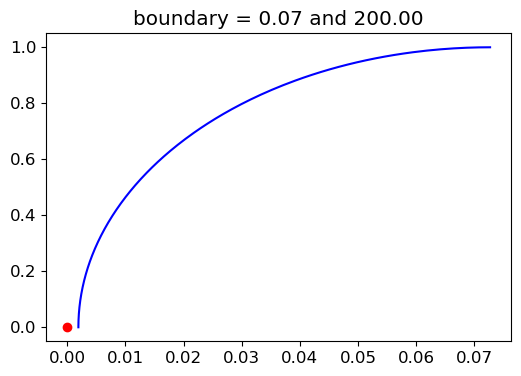

In [32]:
RainfallRate = 200
frainbest(RainfallRate)

## Height of aquifier over time with rainfall

### Finding it difficult to convert back to h = tf(x/t), our plot is h vs eta, does this make sense?
### If so why does is go so high?

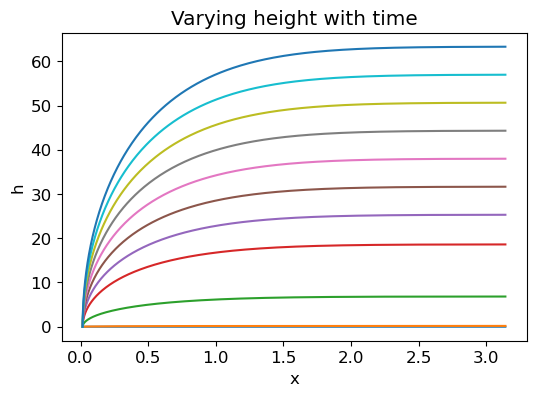

In [37]:
x_rain = np.linspace(0,1,len(eta_rain))
t_rain = x_rain/eta_rain
h_rain = np.zeros([len(x_rain),len(t_rain)])
#print(h_rain.shape)

i=0
while (i < len(eta_rain)):
    h_rain[:,i] = t_rain[i]*f_rain[:] 
    i=i+1
#plt.plot(eta_rain, h_rain[:,::200])
plt.plot(eta_rain, h_rain[:,::200])
plt.xlabel('x')
plt.ylabel('h')
plt.title('Varying height with time')
plt.show()

# Are we alleged, Why does h go so high?



## Corrected  $h = t f(\frac{x}{t})$ expression, plots height of Aquifer with Rainfall

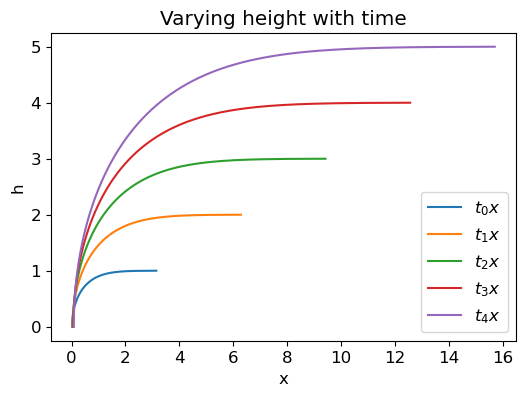

2020


In [40]:
x
f_rain[:] 
t =np.linspace(1,5,5)
for i in range(5):
    f = t[i]*f_rain[:]
    x = eta_rain*t[i]
    plt.plot(x, f, label = f'$t_{i} x$')


plt.xlabel('x')
plt.ylabel('h')
plt.title('Varying height with time')
plt.legend()
plt.show()
print(f_rain[:].size)

In [42]:
print(len(f_rain[:]))

2020


In [44]:
print(f_rain[:])

[1.00000000e+00 9.99995100e-01 9.99975198e-01 ... 5.16741449e-08
 5.11734155e-08 5.06677379e-08]


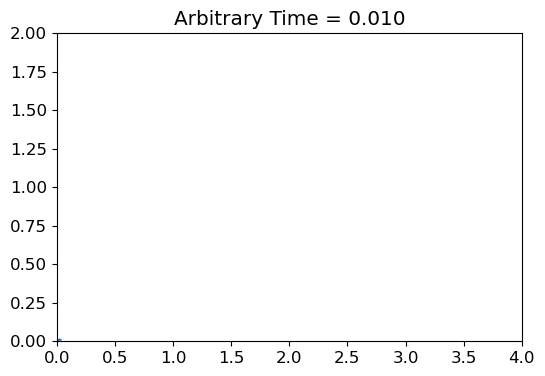

In [48]:
fig, ax = plt.subplots()
ax.axis([0,4,0,2])
x_1=eta_rain
h_1 = f_rain[:]
l, = ax.plot([],[])

def animate(i):
    t = np.linspace(0.01, 5, len(h_1))  # Modified to match length of h_1
    l.set_data(t[i]*x_1, h_1 * t[i])
    ax.set_title(f'Arbitrary Time = {t[i]:.3f}')

    
    
    
ani = FuncAnimation(fig, animate, frames=300,interval=10)

from IPython.display import HTML
HTML(ani.to_jshtml())

# 3

## Calculating Flux

### Combining Rainfall and Drought

### We use that the flux with rainfall is 
### $\hat {Q}_0 = -\hat{t}f(0)f'(0) = \frac{-C^2 \hat t}{2}$    eqn 4.64
### $\hat Q_0 = \frac{-D^2}{2\hat t^2}$   eqn 4.90
### Therefore we make these equal to solve for A
## We have from the notes $D = \sqrt{2X(0)X'(0)} $
### We get $A = \pm \sqrt{(\frac{2D^2}{C^2t})}-t$
### Just to note we use the absolute value of this Flux

In [52]:
def frainbest(R):
    ## remember to change searching region for true right bound
    initderiv = np.linspace(3,4,100)
    yx1 = np.array([])
    for el in initderiv:
        sol =solve_ivp(frain,[el,0],[1,0.001],args = (R,), rtol=1e-12,atol = 1e-12)
        t = sol.t
        yx1 = np.append(yx1,sol.y[0][-1])
    tol = 10e-4
    i=0
    while (i<len(initderiv)):
        if (yx1[i]<=tol):
            boundary = initderiv[i]
            break
        i+=1
    sol =solve_ivp(frain,[boundary,0],[1,0.001],args = (R,), rtol=1e-12,atol = 1e-12)
    y = sol.y
    t = sol.t
    C = np.sqrt(2*y[0][-1]*y[1][-1])
    return C,boundary

In [54]:
C,boundary = frainbest(1)
C

1.2183396582162898

In [55]:
D =np.sqrt(2* X[-1]*dX[-1])
D

1.1709401241247828

In [56]:
# Afind
def Afind(t,C,D):
    return +(np.sqrt(D**2/(C**2*t))-t)

A = Afind(1,C,D)

def QDrought(t,D,A):
    return -D**2/(2*((t+A)**2))

def Qrain(t,C):
    return -C**2*t/2
print(Afind(1,C,D))

-0.038905024368083296


In [68]:
# t0 find
#Array_Drought = QDrought(t2,D,A)
t_long = np.linspace(0,10,100)
Array_Rain_long = Qrain(t_long,C)

def t0_find(Array_Drought, Array_Rain_long, t_long):
    
    closest_index = np.argmin(np.abs(Array_Rain_long - Array_Drought[-1]))
    t0 = t_long[closest_index]
    
    return t0
    
#t0 = t0_find(Array_Drought, Array_Rain_long, t_long)

Text(0.5, 1.0, 'Flux into the river')

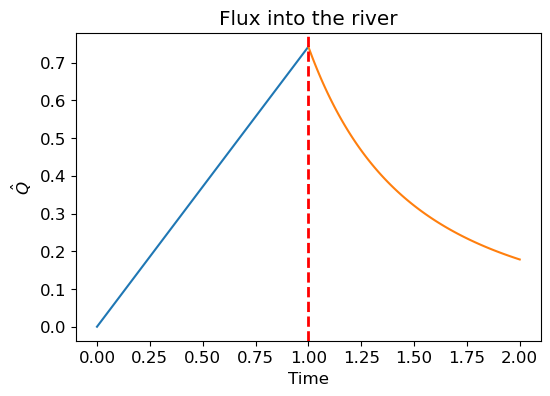

In [70]:
t1 = np.linspace(0,1,100)
t2 = np.linspace(1,2,100)
plt.plot(t1,np.abs(Qrain(t1,C)))
plt.plot(t2,np.abs(QDrought(t2,D,A)))

plt.axvline(1, color='red', linestyle='--', linewidth=2)

plt.xlabel('Time')
plt.ylabel('$\\hat{Q}$')
plt.title('Flux into the river')

In [72]:
def periodic_flux(top_hat, Flux_Array, Array_Rain_long):
    t0 = 0
    Array_Drought = np.zeros(100)
    C = 1.2183396582163215
    D = 1.1709401241247854
    t = np.zeros(100)
    i = 1
    while(i<len(top_hat)):
        # Rainfall
        if(top_hat[i]==1):
            if(top_hat[i-1]==0):
                t0 = t0_find(Array_Drought, Array_Rain_long, t_long)
            else:
                t0 = t0 + 1
               
            t = np.linspace(t0,t0+1,100)
            Flux_Array[100*i:100*(i+1)] = np.abs(Qrain(t,C))
           
           
        else:
            # Drought
            if(top_hat[i-1]==1):
                t_end = t[-1]
                A = Afind(t_end,C,D)
            else:
                t_end = t_end + 1
                 
            t = np.linspace(t_end,t_end+1,100)
            Array_Drought = np.abs(QDrought(t,D,A))
            Flux_Array[100*i:100*(i+1)] = np.abs(QDrought(t,D,A))
           
        i = i+1

    return Flux_Array



# Periodic Flux Graph

25


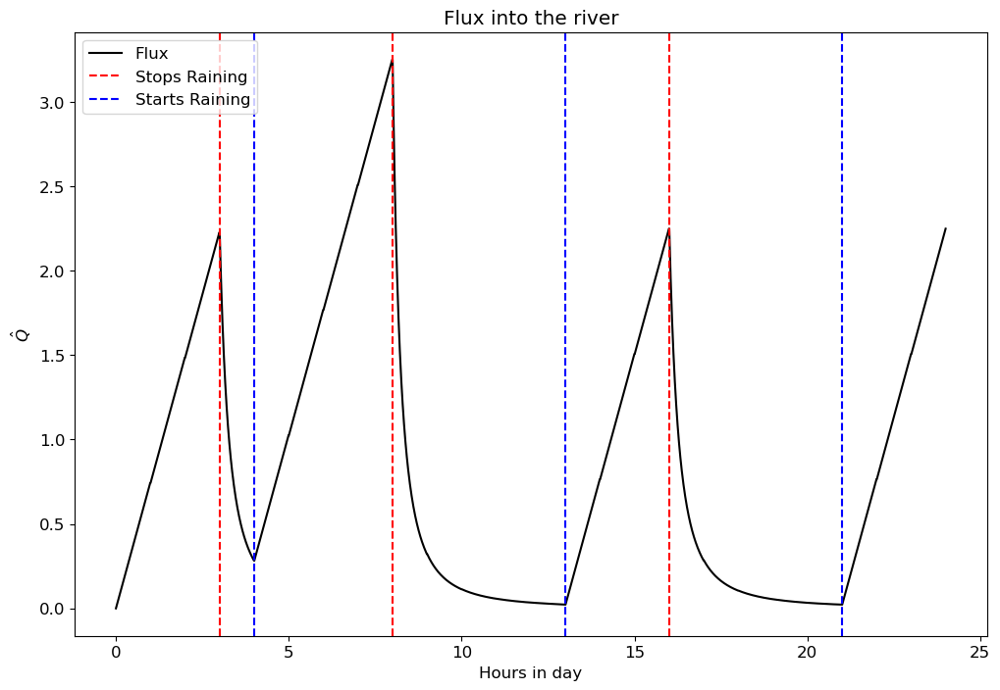

In [78]:
top_hat = np.concatenate([np.zeros(1), np.ones(3),np.zeros(1),np.ones(4),np.zeros(5),np.ones(3),
                          np.zeros(5), np.ones(3)])
print(len(top_hat))

plt.figure(figsize=(12, 8))

# multiply by 25 because hours in a day
Flux_Array = np.zeros(100*25)
t_long = np.linspace(0,20,2000)
Array_Rain_long = np.abs(Qrain(t_long,C))

Flux = periodic_flux(top_hat, Flux_Array, Array_Rain_long)
time_array = np.linspace(0,24,2400)
plt.plot(time_array, Flux[100:], color = 'black', label = 'Flux')

# add vertical red lines (Stops Raining)
# add vertical green lines (Starts Raining)
changes = np.diff(top_hat[1:])

blue_label_added = False
red_label_added = False

for i, change in enumerate(changes):
    if change == 1:  # 0 to 1 change
        if not blue_label_added:
            plt.axvline(i + 1, color='blue', linestyle='--', label='Starts Raining')
            blue_label_added = True
        else:
            plt.axvline(i + 1, color='blue', linestyle='--')
    elif change == -1:  # 1 to 0 change
        if not red_label_added:
            plt.axvline(i + 1, color='red', linestyle='--', label='Stops Raining')
            red_label_added = True
        else:
            plt.axvline(i + 1, color='red', linestyle='--')
           
plt.xlabel('Hours in day')
plt.ylabel('$\\hat{Q}$')
plt.title('Flux into the river')
plt.legend(loc='upper left')

# 4

## Parameter search with data

## We are plotting discharge
## further details here https://data.usgs.gov/datacatalog/data/USGS:5dcd62fae4b069579760aedd

## There are 5 different data sets

In [82]:
from scipy.optimize import minimize
import numpy.linalg as npl

In [84]:
excel_file=pd.ExcelFile('hyrdodata.xlsx')
df=pd.read_excel(excel_file, sheet_name="figure 2_unit_hydrograph")

In [85]:
t = df["Time"][:371].values
avgstart = df["peakAvg_start"][:371].values

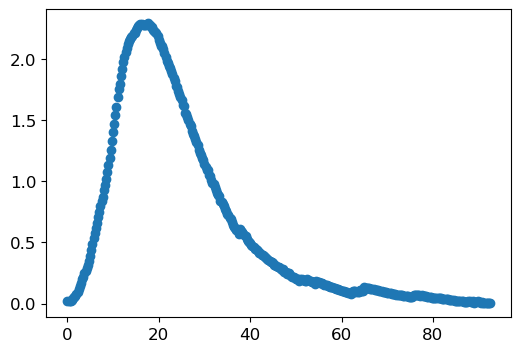

In [86]:
plt.scatter(t,avgstart)

In [87]:
tmax = 65
train = t[:tmax]
tdrought = t[tmax-1:]

In [88]:
def fluxrain(C,train,p1):
    return C**2/2*p1*train
#plt.plot(train,fluxrain(C,train,2))

def thetafind(D,C,p1,p2,tendofrain):
    return np.sqrt(D**2/C**2*p2/(p1*tendofrain))-tendofrain

def fluxdrought(D,train,tdrought,p2,p1):
    theta =thetafind(D,C,p1,p2,train[-1])
    return D**2/2*p2*1/(tdrought+theta)**2

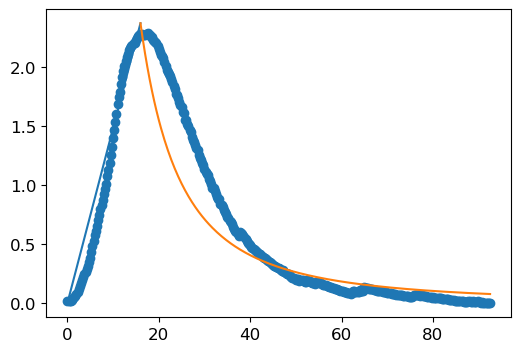

In [89]:
p1 = 0.2
p2 = 1000
plt.plot(train,fluxrain(C,train,p1))
plt.plot(tdrought,fluxdrought(D,train,tdrought,p2,p1))
plt.scatter(t,avgstart)

0 65.13376149204572
1 52.70553624976747
2 40.72484641146213
3 29.889918170134923
4 20.625007866608257
5 14.224267867788328
6 12.100830533125698
7 21.951921548497367
8 34.38748875047593
9 46.82305595245445


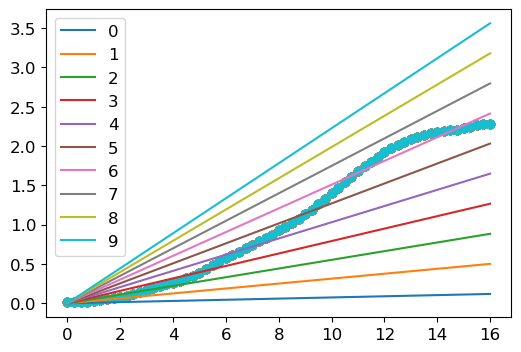

In [92]:
p1 = np.linspace(0.01,0.3,10)
it = 0 
for p1 in p1:
    Qrain = fluxrain(C,train,p1)
    plt.plot(train, Qrain,label = "%.0f"%it)
    plt.scatter(t[:65],avgstart[:65])
    plt.legend()
    i=0
    L2norm = 0
    while(i<65):
        L2norm += np.abs(Qrain[i]-avgstart[i])
        i+=1
    print(it, L2norm)
    it +=1

0 111.00649526518849
1 50.8385069173518
2 48.14516788029076
3 55.93675615196955
4 65.68096570765505


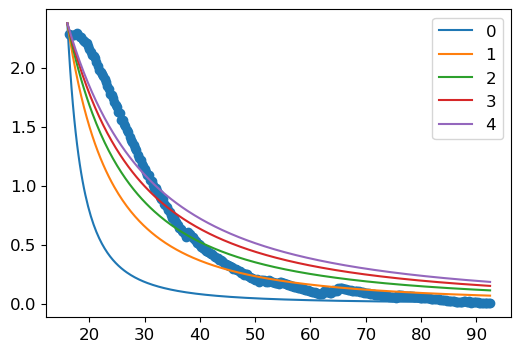

In [97]:
n = 5
#p1 = np.linspace(1,6,n)
p1 = 0.2
p2 = np.linspace(100,3000,n)
j=0
while(j<n):
    Qdrought = fluxdrought(D,train,tdrought,p2[j],p1)
    i = 65
    L2norm = 0
    while(i<371):
        L2norm += np.abs(Qdrought[i-65]-avgstart[i])
        i+=1
    plt.plot(tdrought,Qdrought,label = "%.0f"%j)
    print(j,L2norm)
    j+=1
plt.scatter(t[65:],avgstart[65:])
plt.legend()

In [99]:
tmax = 65
train = t[:tmax]
tdrought = t[tmax:]
def L2norm(params, train, tdrought):
    p1 = params[0]
    p2 = params[1]
    Qrain = fluxrain(C,train,p1)
    Qdrought = fluxdrought(D,train,tdrought,p2,p1)
    Qtest = np.concatenate((Qrain,Qdrought))
    L2norm = npl.norm(Qtest-avgstart)
    return L2norm
#L2norm([0.1,100],train,tdrought)

In [102]:
initial_param = [0.1,1400] 
result = minimize(L2norm, initial_param, args=(train,tdrought),method= 'BFGS')
p1 = result.x[0]
p2 = result.x[1]
print(p1,p2)

0.2132296769294441 1841.3111121970196


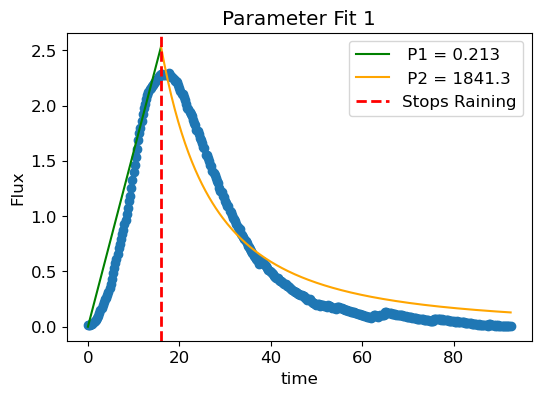

In [104]:
tmax = 65
train = t[:tmax]
tdrought = t[tmax-1:]
plt.plot(train,fluxrain(C,train,p1),color = 'Green',label = " P1 = %.3f"%p1)
plt.plot(tdrought,fluxdrought(D,train,tdrought,p2,p1),color = 'Orange', label = " P2 = %.1f"%p2 )
plt.scatter(t,avgstart)
plt.legend()
plt.xlabel('time')
plt.ylabel('Flux')
plt.title('Parameter Fit 1')
#plt.savefig('Parameter Fit 1')

plt.axvline(t[tmax-1], color='red', linestyle='--', linewidth=2, label = 'Stops Raining')

plt.legend()

0.3024116325580292 4907.562823822264


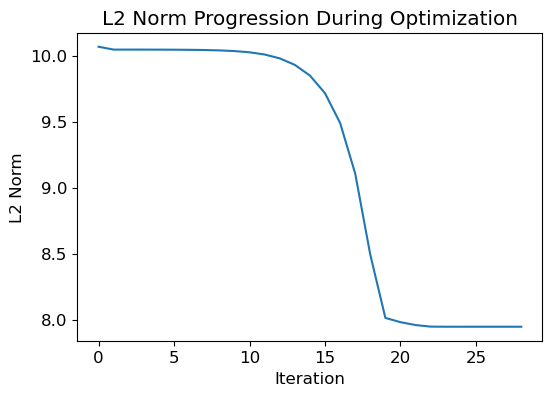

In [106]:
import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Define initial parameters
tmax = 38
train = t[:tmax]
tdrought = t[tmax:]
initial_param = [.1, 1200]

# Function to calculate L2 norm
def L2norm(params, train, tdrought):
    p1 = params[0]
    p2 = params[1]
    Qrain = fluxrain(C, train, p1)
    Qdrought = fluxdrought(D, train, tdrought, p2, p1)
    Qtest = np.concatenate((Qrain, Qdrought))
    L2norm = np.linalg.norm(Qtest - avgstart)
    return L2norm

# List to store values at each iteration for plotting
iteration_values = []

# Define a callback function to capture parameter and loss values at each iteration
def store_iteration_values(xk):
    # Here, store the current parameter values (xk) and L2 norm value
    iteration_values.append(L2norm(xk, train, tdrought))

# Perform optimization with callback to store each iteration's L2 norm
result = minimize(L2norm, initial_param, args=(train, tdrought), method='BFGS', callback=store_iteration_values)

# Extract the optimized parameters
p1 = result.x[0]
p2 = result.x[1]

# Print the optimized parameters
print(p1, p2)

# Plot the iteration progress
plt.plot(iteration_values)
plt.xlabel('Iteration')
plt.ylabel('L2 Norm')
plt.title('L2 Norm Progression During Optimization')
plt.show()

In [108]:
t = df["Time"][486:770].values
avgstart = df["peakAvg_start"][486:770].values

In [110]:
tmax = 38
train = t[:tmax]
tdrought = t[tmax:]
def L2norm(params, train, tdrought):
    p1 = params[0]
    p2 = params[1]
    Qrain = fluxrain(C,train,p1)
    Qdrought = fluxdrought(D,train,tdrought,p2,p1)
    Qtest = np.concatenate((Qrain,Qdrought))
    L2norm = npl.norm(Qtest-avgstart)
    return L2norm

In [112]:
initial_param = [0.01,1400] 
result = minimize(L2norm, initial_param, args=(train,tdrought), method= 'BFGS')#, options=option)
p1 = result.x[0]
p2 = result.x[1]


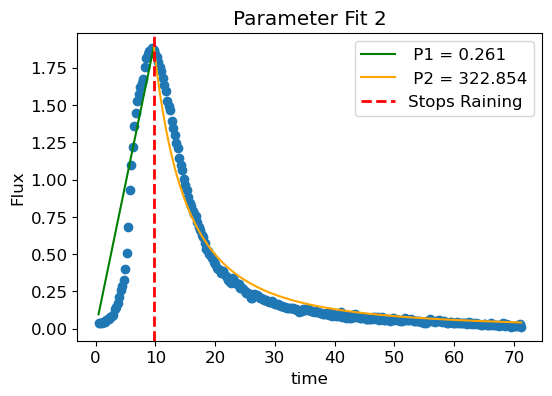

In [114]:
tmax = 38
train = t[:tmax]
tdrought = t[tmax-1:]
plt.plot(train,fluxrain(C,train,p1),color = 'green',label = " P1 = %.3f"%p1)
plt.plot(tdrought,fluxdrought(D,train,tdrought,p2,p1),color = 'orange',label = " P2 = %.3f"%p2)
plt.scatter(t,avgstart)
plt.xlabel('time')
plt.ylabel('Flux')
plt.title('Parameter Fit 2')
#plt.savefig('Parameter Fit 2')

plt.axvline(t[tmax-1], color='red', linestyle='--', linewidth=2, label = 'Stops Raining')

plt.legend()

In [116]:
t = df["Time"][784:1100].values
avgstart = df["peakAvg_start"][784:1100].values
#print(avgstart[120])

In [118]:
tmax = 120
train = t[:tmax]
tdrought = t[tmax:]
def L2norm(params, train, tdrought):
    p1 = params[0]
    p2 = params[1]
    Qrain = fluxrain(C,train,p1)
    Qdrought = fluxdrought(D,train,tdrought,p2,p1)
    Qtest = np.concatenate((Qrain,Qdrought))
    L2norm = npl.norm(Qtest-avgstart)
    return L2norm

In [120]:
initial_param = [0.01,1100] 
result = minimize(L2norm, initial_param, args=(train,tdrought), method= 'BFGS')
p1 = result.x[0]
p2 = result.x[1]
print(p1,p2)

0.06661417191684726 2072.3179660794253


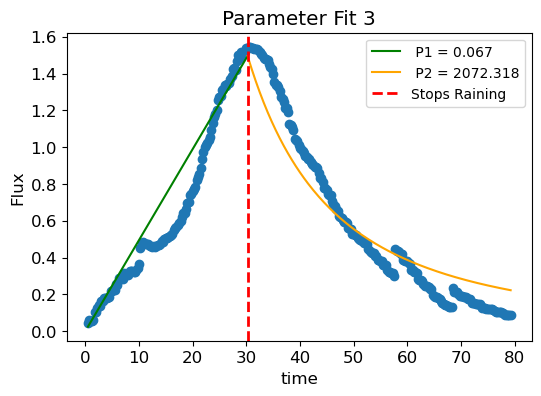

In [122]:
tmax = 120
train = t[:tmax]
tdrought = t[tmax-1:]
plt.plot(train,fluxrain(C,train,p1),color = 'Green',label = " P1 = %.3f"%p1)
plt.plot(tdrought,fluxdrought(D,train,tdrought,p2,p1),color = 'orange',label = " P2 = %.3f"%p2)
plt.scatter(t,avgstart)
plt.xlabel('time')
plt.ylabel('Flux')
plt.title('Parameter Fit 3')
#plt.savefig('Parameter Fit 3')
plt.axvline(t[tmax-1], color='red', linestyle='--', linewidth=2, label = 'Stops Raining')
plt.legend(fontsize='small')

In [124]:
t = df["Time"][1124:1470].values
avgstart = df["peakAvg_start"][1124:1470].values
#plt.scatter(t,avgstart)

In [126]:
tmax = 43
train = t[:tmax]
tdrought = t[tmax:]
def L2norm(params, train, tdrought):
    p1 = params[0]
    p2 = params[1]
    Qrain = fluxrain(C,train,p1)
    Qdrought = fluxdrought(D,train,tdrought,p2,p1)
    Qtest = np.concatenate((Qrain,Qdrought))
    L2norm = npl.norm(Qtest-avgstart)
    return L2norm

In [128]:
initial_param = [0.01,1100] 
result = minimize(L2norm, initial_param, args=(train,tdrought), method= 'BFGS')
p1 = result.x[0]
p2 = result.x[1]
print(p1,p2)

0.08360049191381504 611.0910055508263


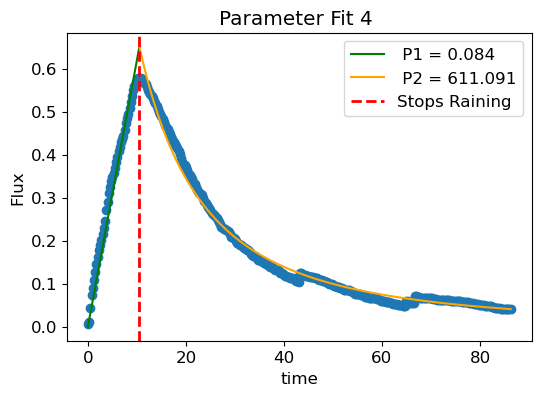

In [130]:
tmax = 43
train = t[:tmax]
tdrought = t[tmax-1:]
plt.plot(train,fluxrain(C,train,p1),color = 'Green',label = " P1 = %.3f"%p1)
plt.plot(tdrought,fluxdrought(D,train,tdrought,p2,p1),color = 'orange',label = " P2 = %.3f"%p2)
plt.scatter(t,avgstart)
plt.xlabel('time')
plt.ylabel('Flux')
plt.title('Parameter Fit 4 ')
plt.savefig('Parameter Fit 4')
plt.axvline(t[tmax-1], color='red', linestyle='--', linewidth=2, label = 'Stops Raining')
plt.legend()

# Extract Realistic Values from P1 and P2

### Issue is Data is not measured in SI Units, Convert everything to SI Units

### Parameter 1: $(\frac{m^3}{mms^2})hr$
### Parameter 1: $(\frac{m^2}{s})*1000*3600$
### Therefore, to get true Parameter 1 value in SI Units Divide by 3,600,000

### Parameter 2: $(\frac{m^3s}{mm})\frac{1}{hr^2}$
### Parameter 2: $(\frac{m^2}{s})*1000*(\frac{1}{3600})^2$
### Therefore, to get true Parameter 2 value in SI Units Multiply by 12,960

## Check with our values

### Data 1: P1 = 0.213 & P2 = 1841 $ \implies $ P1 = $ 5.9 \times 10^{-8} $ & P2 = $ 2.4 \times 10^{7} $

### Data 2: P1 = 0.261 & P2 = 323 $ \implies $ P1 = $ 7.25 \times 10^{-8} $ & P2 = $ 4.2 \times 10^{6} $

### Data 3: P1 = 0.067 & P2 = 2072 $ \implies $ P1 = $ 1.9 \times 10^{-8} $ & P2 = $ 2.7 \times 10^{7} $

### Data 4: P1 = 0.084 & P2 = 611 $ \implies $ P1 = $ 2.3 \times 10^{-8} $ & P2 = $ 7.9 \times 10^{6} $

###  However our issue remains that we cannot seperate p1 and p2 into there indivual values
### (e.g. R, Phi, K, L) As we were not supplied with this information in the excel file